## Load and Process Image

In [1]:
import cv2
import numpy as np
# import matplotlib.pyplot as plt
import plotly.express as px

# Read RGB image 
img = cv2.imread('./data/000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0_green.png')  
  
# Output img with window name as 'img' 
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# blur the image to reduce noise
figure_size = 9 # the dimension of the x and y axis of the kernal.
img = cv2.blur(img,(figure_size, figure_size))
px.imshow(img)

error: OpenCV(4.3.0) /Users/travis/build/skvark/opencv-python/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [2]:
shape = img.shape
images = np.zeros((1, *shape))
images[0] = img

## Convert image to binary

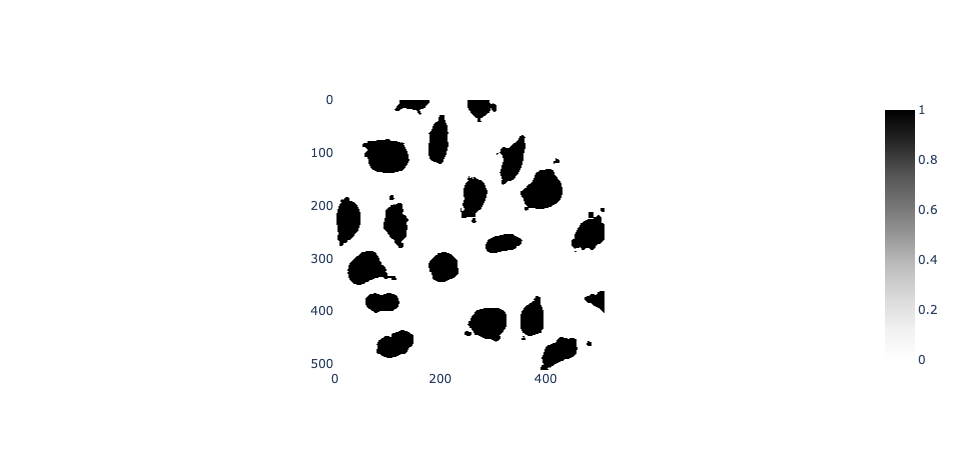

In [3]:
from gtda.images import HeightFiltration, RadialFiltration, \
    DilationFiltration, ErosionFiltration, SignedDistanceFiltration, \
    Binarizer

bz = Binarizer(threshold=20/255)
binned = bz.fit_transform_plot(images)

In [29]:
from gtda.pipeline import make_pipeline
from gtda.diagrams import BettiCurve
from gtda.homology import CubicalPersistence
from gtda.diagrams import PersistenceEntropy
import pandas as pd
import seaborn as sns

p = make_pipeline(HeightFiltration(direction=np.array([1,1])), CubicalPersistence(), BettiCurve())
p.fit_transform(binned)

array([[[ 1,  1,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  5,  4,  4,  5,
          5,  5,  6,  6,  7,  7,  7,  7,  8,  8,  8,  8,  8,  8,  8, 10,
         11, 12, 11, 12, 13, 12, 12, 12, 14, 14, 14, 14, 15, 17, 17, 17,
         18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 19, 19, 20, 21,
         22, 24, 22, 23, 23, 23, 25, 24, 24, 24, 24, 25, 25, 25, 25, 25,
         26, 26, 26, 28, 27, 28, 27, 27, 27, 27, 28, 28, 28, 28, 28, 28,
         28, 28, 28,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0]]])

## Pipline above  broken down into individual steps

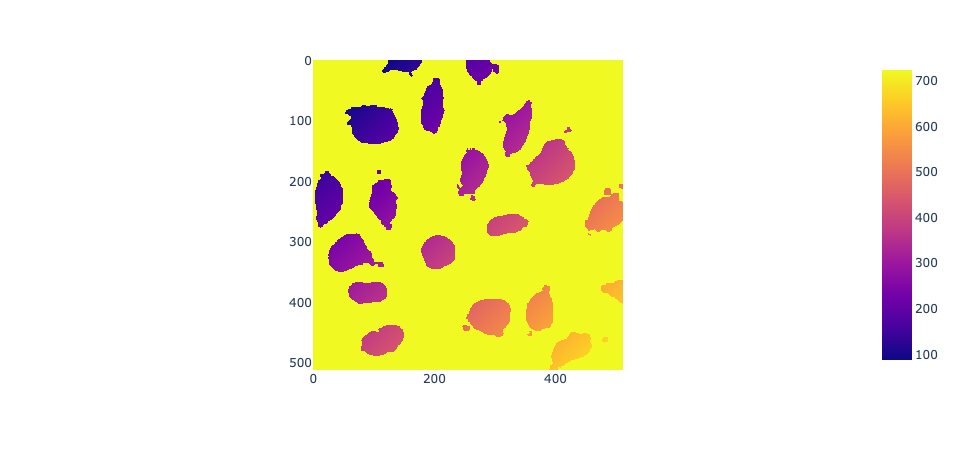

In [5]:
hf = HeightFiltration(direction=np.array([1,1]))
hf_images = hf.fit_transform(binned)
px.imshow(hf_images[0])

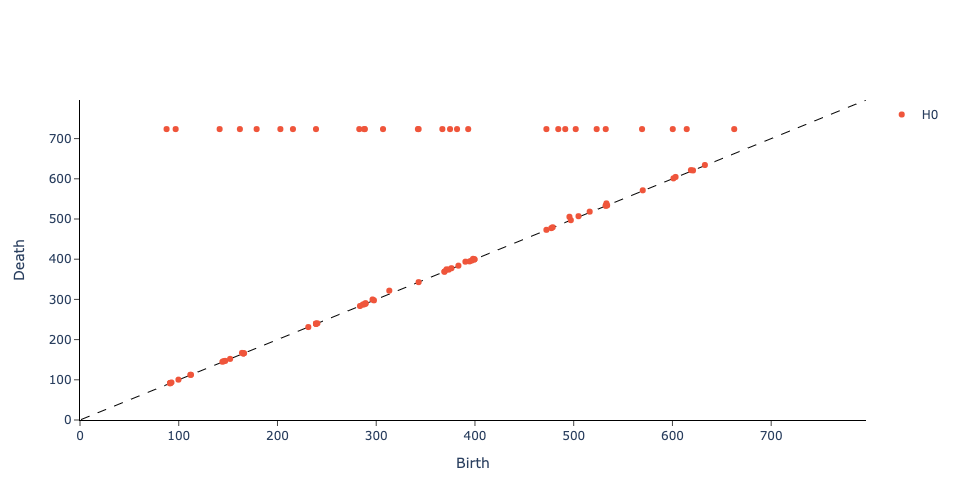

In [6]:
cp = CubicalPersistence()
barcodes = cp.fit_transform_plot(hf_images)

In [7]:
pe = PersistenceEntropy()
pe.fit_transform(barcodes)

array([[ 3.26131392, -0.        ]])

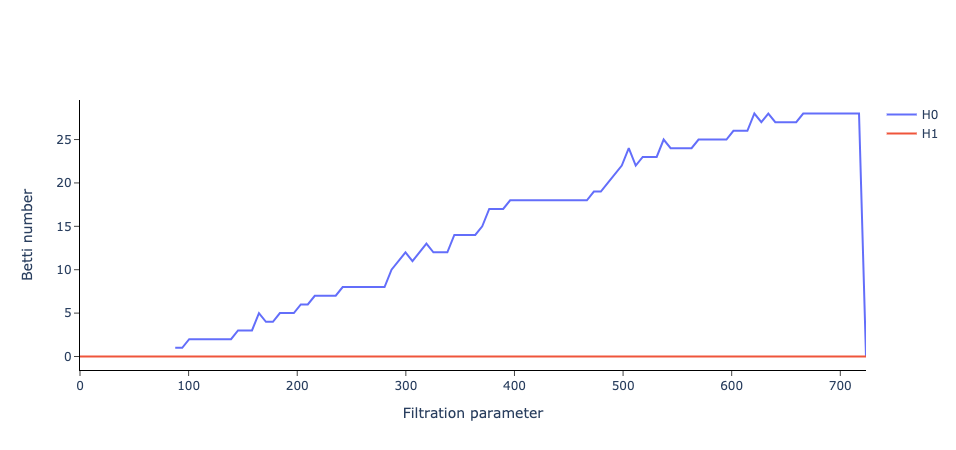

array([[[ 1,  1,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  5,  4,  4,  5,
          5,  5,  6,  6,  7,  7,  7,  7,  8,  8,  8,  8,  8,  8,  8, 10,
         11, 12, 11, 12, 13, 12, 12, 12, 14, 14, 14, 14, 15, 17, 17, 17,
         18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 19, 19, 20, 21,
         22, 24, 22, 23, 23, 23, 25, 24, 24, 24, 24, 25, 25, 25, 25, 25,
         26, 26, 26, 28, 27, 28, 27, 27, 27, 27, 28, 28, 28, 28, 28, 28,
         28, 28, 28,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0]]])

In [8]:
from gtda.diagrams import BettiCurve
bc = BettiCurve()
bc.fit_transform_plot(barcodes)